# Plotly Tutorial


## Prepare

In [12]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import pandas as pd
import plotly.graph_objects as go
import cufflinks as cf
import chart_studio.plotly as py
import seaborn as sns
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
%matplotlib inline
init_notebook_mode(connected=True)
cf.go_offline()

## Basics


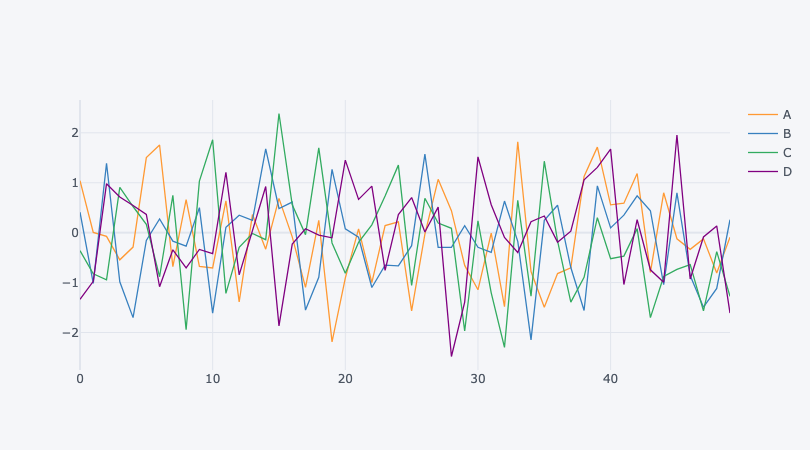

In [19]:
arr_1 = np.random.randn(50,4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])
df_1.head()
# df_1.plot()
df_1.iplot()

## Line Plots

In [60]:
df_stocks = px.data.stocks()
df_stocks.head()


,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


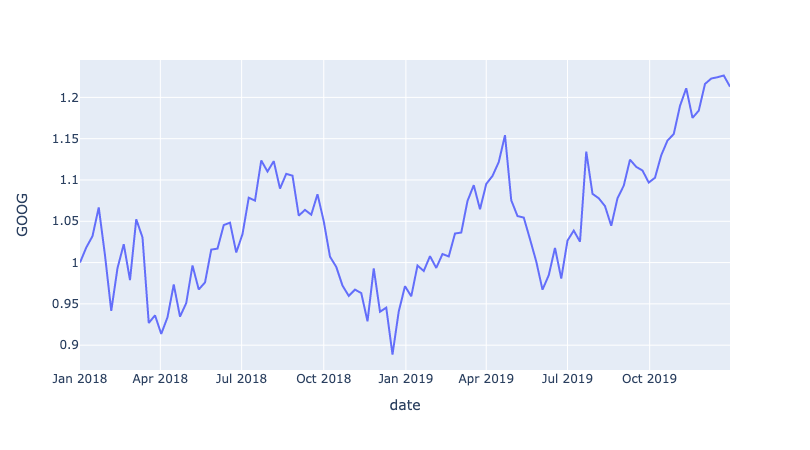

In [56]:
px.line(df_stocks, x='date', y='GOOG', 
       labels={'x': 'Date', 'y': 'Price' })

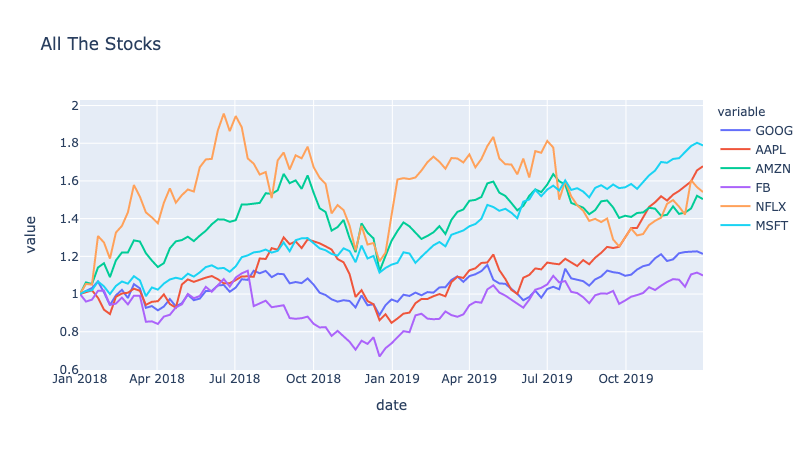

In [58]:
px.line(df_stocks, x='date', y=['GOOG', 'AAPL', 'AMZN', 'FB', 'NFLX', 'MSFT'], 
       labels={'x': 'Date', "y": 'Price' }, title='All The Stocks')

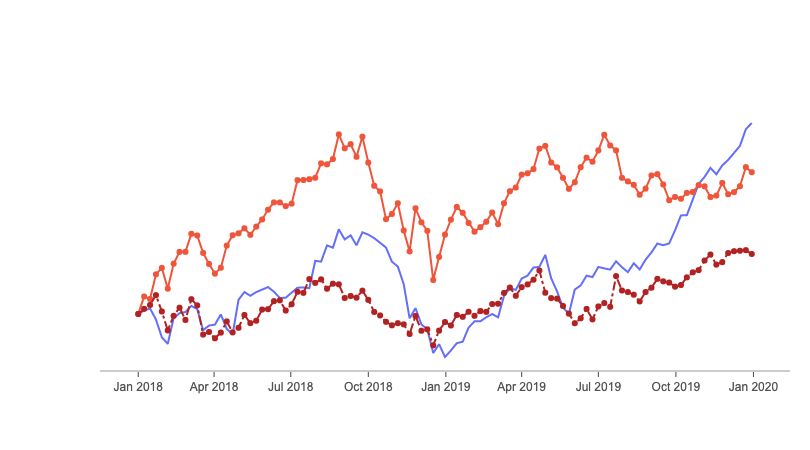

In [69]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= df_stocks.date, y = df_stocks.AAPL,
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x= df_stocks.date, y = df_stocks.AMZN,
                        mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x= df_stocks.date, y = df_stocks.GOOG,
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2,
                                 dash='dashdot')))
# -----------------------------------------------------------------
# fig.update_layout(title='Stock Price Data 2018-2020',
#                  xaxis_title='Date',
#                  yaxis_title='Price',)
# -----------------------------------------------------------------
fig.update_layout(
        xaxis=dict(
            showline=True,
            showgrid=False,
            showticklabels=True,
            linecolor='rgb(204,204,204)',
            linewidth=2,
            ticks='outside',
            tickfont=dict(
                family='Arial',
                size=12,
                color='rgb(82,82,82)'
                ),
        ),
        yaxis=dict(
            showgrid=False, 
            zeroline=False, 
            showline=False, 
            showticklabels=False
            ),
        autosize=False,
        margin=dict(
            autoexpand=False,
            l=100,
            r=20,
            t=110,
            ),
        showlegend=False,
        plot_bgcolor='white',
    )


## Bar Charts

In [74]:
df_us = px.data.gapminder().query("country == 'United States'")
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1608,United States,Americas,1952,68.44,157553000,13990.48208,USA,840
1609,United States,Americas,1957,69.49,171984000,14847.12712,USA,840
1610,United States,Americas,1962,70.21,186538000,16173.14586,USA,840
1611,United States,Americas,1967,70.76,198712000,19530.36557,USA,840
1612,United States,Americas,1972,71.34,209896000,21806.03594,USA,840


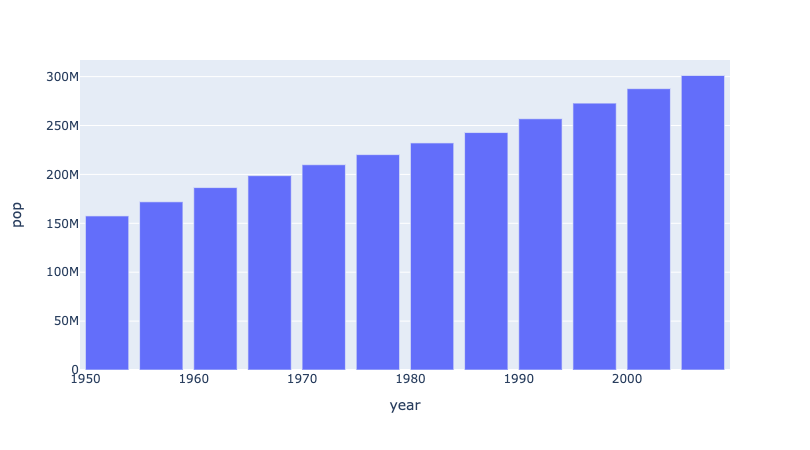

In [77]:
px.bar(df_us, x='year', y='pop')

In [81]:
df_tips = px.data.tips()
df_tips.head()


,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


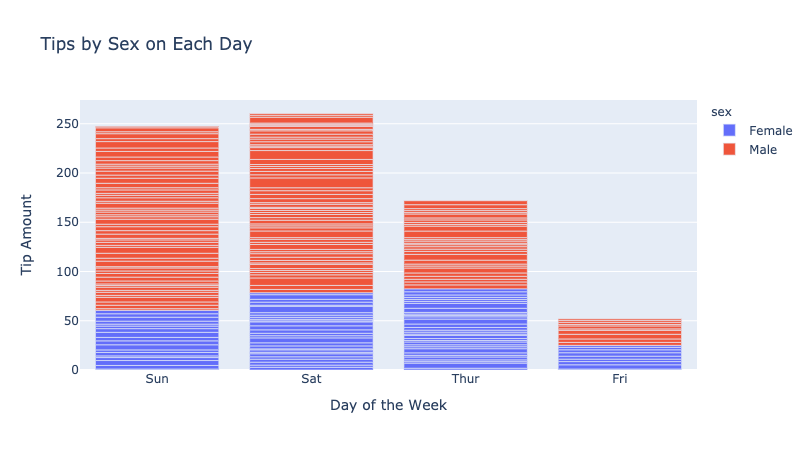

In [82]:
px.bar(df_tips, x='day', y='tip', color='sex', 
       title='Tips by Sex on Each Day',
      labels={'tip': 'Tip Amount', 'day': 'Day of the Week'})

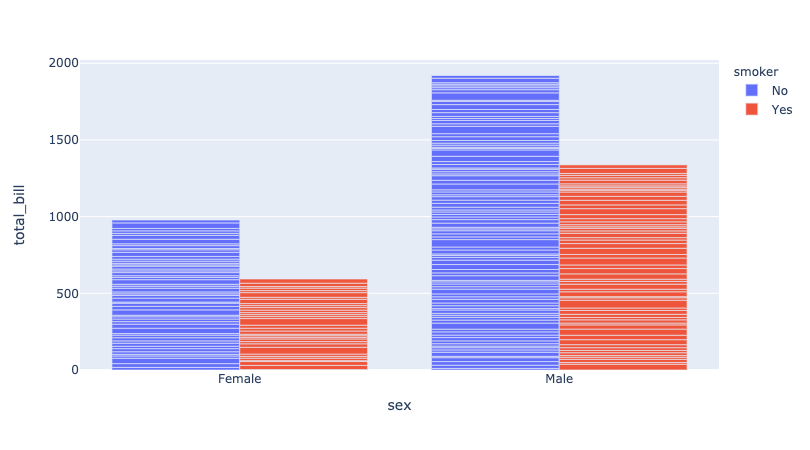

In [83]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group') 

In [84]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
df_europe.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
83,Austria,Europe,2007,79.829,8199783,36126.492700,AUT,40
119,Belgium,Europe,2007,79.441,10392226,33692.605080,BEL,56
155,Bosnia and Herzegovina,Europe,2007,74.852,4552198,7446.298803,BIH,70
191,Bulgaria,Europe,2007,73.005,7322858,10680.792820,BGR,100


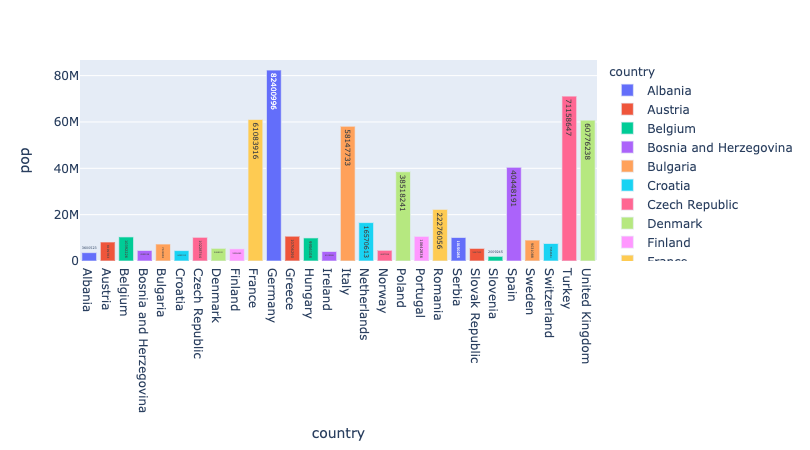

In [88]:
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig

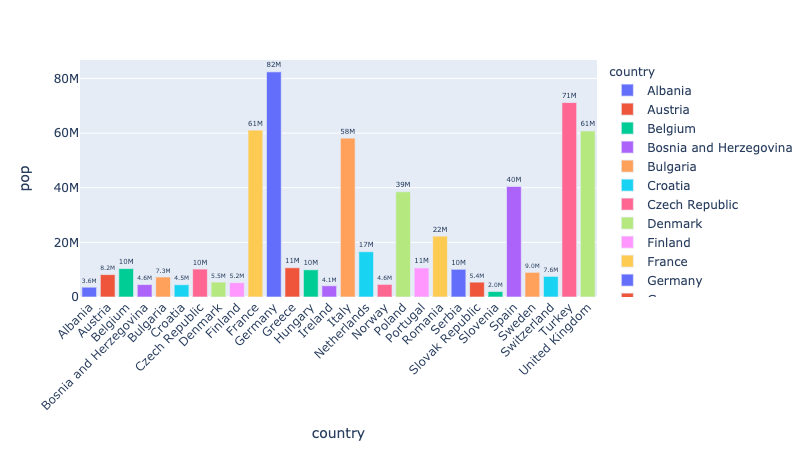

In [91]:
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)
fig

## Scatter Plots

In [93]:
df_iris = px.data.iris()
df_iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


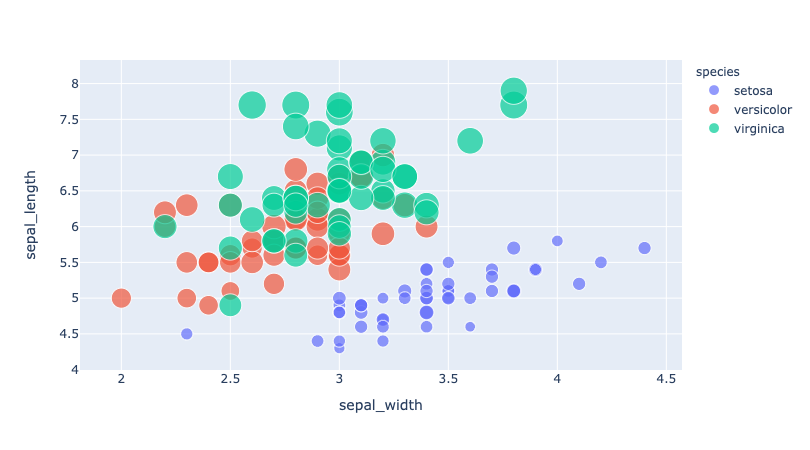

In [94]:
px.scatter(df_iris, x='sepal_width', y='sepal_length',
          color = 'species', size = 'petal_length',
          hover_data=['petal_width'])

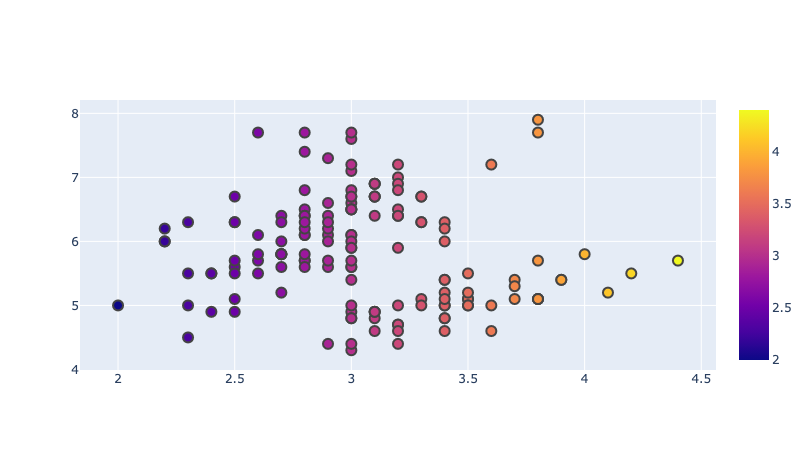

In [96]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width,
    y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(
        showscale=True
    )
))

fig.update_traces(marker_line_width=2, marker_size=10)
fig

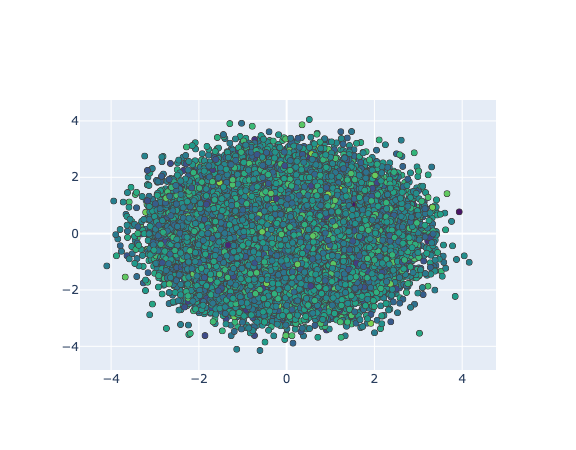

In [100]:
fig = go.Figure(data=go.Scattergl(
    x=np.random.randn(100000),
    y=np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig

## Pie Charts

## Histogram

## Box Plots

## Violin Plots

## Density Heatmap

## 3D Scatter Plots

## 3D Line Plots

## Scater Matrix

## Map Scatter Plots

## Choropleth Maps

## Polar Charts

## Ternary Plots

## Facets

## Animated Plots